# Import Libraries and Data

In [1]:
# Loading Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
%matplotlib inline

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import metrics
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from sklearn.calibration import CalibrationDisplay, CalibratedClassifierCV, calibration_curve

In [2]:
# Loading Dataset
raw_data = pd.read_csv("mimic_iv_Final.csv")
raw_data.head()

,subject_id,gender,age,mortality,ethnicity,Heart.Rate,Heart.rate.Alarm...High,Heart.Rate.Alarm...Low,SpO2.Desat.Limit,INR,...,Comb_DS,Fibrillation,PulmonaryDisease,Stroke,Hyperlipidemia,Dementia,AvgBloodPressureSystolic,AvgBloodPressureDiastolic,ConsolidatedRespiratoryRate,AvgHemoglobin
0,10004401,M,82,Death,WHITE,104,120,60,100.0,1.7,...,0,1,0,0,0,0,158.0,129.0,33.75,10.90
1,10005348,M,76,Alive,WHITE,103,160,85,88.0,1.3,...,0,1,0,0,1,0,147.5,75.0,22.75,11.90
2,10010058,M,80,Death,ASIAN - SOUTH EAST ASIAN,155,130,50,85.0,1.5,...,0,3,0,0,1,0,119.5,88.5,29.50,13.65
3,10013049,M,52,Alive,WHITE,91,120,50,85.0,1.6,...,0,0,0,0,0,0,130.0,70.0,15.50,14.25
4,10018423,M,37,Alive,WHITE,105,120,50,85.0,1.6,...,0,0,0,0,0,0,131.5,74.0,22.25,14.50


# Data Preparation

In [3]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3406 entries, 0 to 3405
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   subject_id                   3406 non-null   int64  
 1   gender                       3406 non-null   object 
 2   age                          3406 non-null   int64  
 3   mortality                    3406 non-null   object 
 4   ethnicity                    3406 non-null   object 
 5   Heart.Rate                   3406 non-null   int64  
 6   Heart.rate.Alarm...High      3406 non-null   int64  
 7   Heart.Rate.Alarm...Low       3406 non-null   int64  
 8   SpO2.Desat.Limit             3406 non-null   float64
 9   INR                          3406 non-null   float64
 10  Prothrombin.time             3406 non-null   float64
 11  Anion.gap                    3406 non-null   int64  
 12  Creatinine..serum.           3406 non-null   float64
 13  Bicarbonate       

No missing values, all correct datatype, CHECK.

In [4]:
raw_data['mortality'].value_counts()

mortality
Alive    2916
Death     490
Name: count, dtype: int64

In [5]:
Alive = raw_data['mortality'].value_counts()[0]
Death = raw_data['mortality'].value_counts()[1]

print(f"The data is unbalanced with {Death/(Death+Alive)*100:.1f}% mortality rate.")

The data is unbalanced with 14.4% mortality rate.


In [6]:
# Convert Gender from Str to Numeric
raw_data['gender'] = pd.get_dummies(raw_data['gender'], drop_first = True)
raw_data['mortality'] = pd.get_dummies(raw_data['mortality'], drop_first = True)



##  Following varaibles had to be remove due to type to be able to run random forest.
# raw_data['ethnicity'] = pd.get_dummies(raw_data['ethnicity'], drop_first = True)
# raw_data['Age.Group'] = pd.get_dummies(raw_data['Age.Group'], drop_first = True)

In [7]:
raw_data['mortality'].value_counts()

mortality
False    2916
True      490
Name: count, dtype: int64

In [8]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3406 entries, 0 to 3405
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   subject_id                   3406 non-null   int64  
 1   gender                       3406 non-null   bool   
 2   age                          3406 non-null   int64  
 3   mortality                    3406 non-null   bool   
 4   ethnicity                    3406 non-null   object 
 5   Heart.Rate                   3406 non-null   int64  
 6   Heart.rate.Alarm...High      3406 non-null   int64  
 7   Heart.Rate.Alarm...Low       3406 non-null   int64  
 8   SpO2.Desat.Limit             3406 non-null   float64
 9   INR                          3406 non-null   float64
 10  Prothrombin.time             3406 non-null   float64
 11  Anion.gap                    3406 non-null   int64  
 12  Creatinine..serum.           3406 non-null   float64
 13  Bicarbonate       

In [9]:
raw_data.columns

Index(['subject_id', 'gender', 'age', 'mortality', 'ethnicity', 'Heart.Rate',
       'Heart.rate.Alarm...High', 'Heart.Rate.Alarm...Low', 'SpO2.Desat.Limit',
       'INR', 'Prothrombin.time', 'Anion.gap', 'Creatinine..serum.',
       'Bicarbonate', 'Glucose..whole.blood.', 'GCS...Eye.Opening',
       'Hematocrit', 'Platelet.Count', 'Age.Group', 'Myocardial', 'Rupture',
       'Thrombosis', 'Systolic', 'Diastolic', 'Comb_DS', 'Fibrillation',
       'PulmonaryDisease', 'Stroke', 'Hyperlipidemia', 'Dementia',
       'AvgBloodPressureSystolic', 'AvgBloodPressureDiastolic',
       'ConsolidatedRespiratoryRate', 'AvgHemoglobin'],
      dtype='object')

In [10]:

features = ['gender', 'age', 'Heart.Rate',
       'Heart.rate.Alarm...High', 'Heart.Rate.Alarm...Low', 'SpO2.Desat.Limit',
       'INR', 'Prothrombin.time', 'Anion.gap', 'Creatinine..serum.',
       'Bicarbonate', 'Glucose..whole.blood.', 'GCS...Eye.Opening',
       'Hematocrit', 'Platelet.Count', 'Myocardial', 'Rupture',
       'Thrombosis', 'Systolic', 'Diastolic', 'Comb_DS', 'Fibrillation',
       'PulmonaryDisease', 'Stroke', 'Hyperlipidemia', 'Dementia',
       'AvgBloodPressureSystolic', 'AvgBloodPressureDiastolic',
       'ConsolidatedRespiratoryRate', 'AvgHemoglobin']



## VARIBLES THAT HAD TO BE REMOVED 
# Ethnicyty and 'Age.Group'

# ,'ethnicity', 'Age.Group']


In [11]:
X = raw_data[features]
y = raw_data['mortality']

In [12]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [13]:
# Undersampling the training set
rus = RandomUnderSampler(random_state=42)
X_train_rus, y_train_rus= rus.fit_resample(X_train, y_train)

y_train_rus.value_counts()

mortality
False    331
True     331
Name: count, dtype: int64

In [14]:
#Undersampling the test set
rus = RandomUnderSampler(random_state=42)
X_test_rus, y_test_rus= rus.fit_resample(X_test, y_test)

y_test_rus.value_counts()

mortality
False    159
True     159
Name: count, dtype: int64

# Random Forest Classifier

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

class sklearn.ensemble.RandomForestClassifier(n_estimators=100, *, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)[source]

## Untuned Model Performance

### Balanced Data - Undersampling technique

In [15]:
# Creating a Random Forest Model
rfc = RandomForestClassifier()

# Model Training
rfc_rus = rfc.fit(X_train_rus, y_train_rus)

# Get Prediction Values
y_pred_rus = rfc_rus.predict(X_test_rus)

print("Accuracy:",metrics.accuracy_score(y_test_rus, y_pred_rus))

Accuracy: 0.8270440251572327


Accuracy dropped from 0.87 => 0.77

## Grid Search

### Balanced Data

In [16]:
params = {
    "criterion": ["gini", "entropy", "log_loss"],
    "n_estimators": [50, 100, 250, 500],
    "min_samples_split": range(2, 5),
    "min_samples_leaf": range(1, 4)
}

search_rus = GridSearchCV(rfc_rus, params, n_jobs = -1, cv = 10, verbose = 2)

search_rus.fit(X_train_rus, y_train_rus)

# GridSearchCV results
print("tuned hpyerparameters: (best parameters)", search_rus.best_params_)
print("accuracy :", search_rus.best_score_)


Fitting 10 folds for each of 108 candidates, totalling 1080 fits


tuned hpyerparameters: (best parameters) {'criterion': 'log_loss', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
accuracy : 0.8186567164179104


In [17]:
# In case I lose the grid search results above
# fit the best hyperparameter in the data
search_rus = RandomForestClassifier(criterion = 'entropy', n_estimators = 250, min_samples_split = 2, min_samples_leaf = 1)
search_rus = search_rus.fit(X_train_rus, y_train_rus)

# Results from Best Models

In [18]:
y_prob = search_rus.predict_proba(X_test_rus)
y_prob_rus = search_rus.predict_proba(X_test_rus)

## 2. ROC Curves

In [19]:
# AUC score
rus_auc = roc_auc_score(y_test_rus, y_prob_rus[:,1])
print(f"For the best models: \nBalanced Data AUC = {rus_auc}")

For the best models: 
Balanced Data AUC = 0.8991930698943871


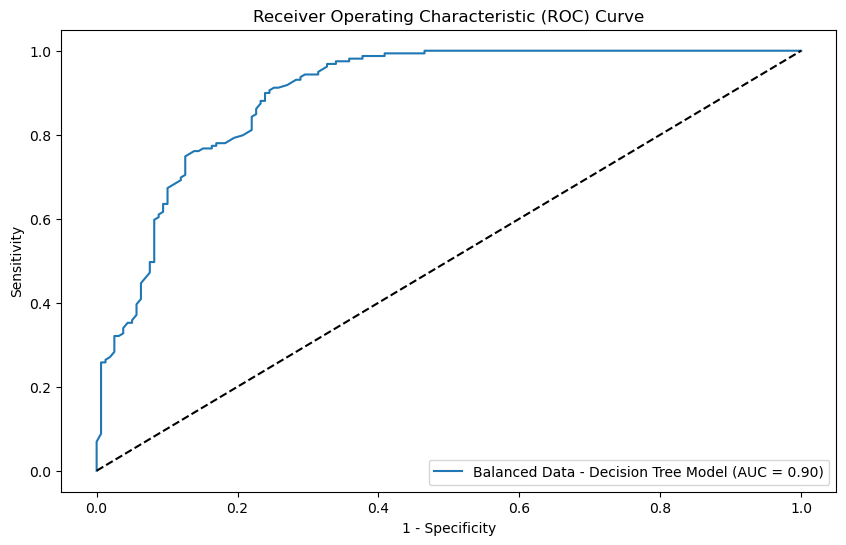

In [20]:
# fpr - false positive rate
# tpr - true positive rate
# threshold - part of the decision function used to calculate fpr and tpr

fpr_rus, tpr_rus, threshold_rus = roc_curve(y_test_rus, y_prob_rus[:,1])


plt.figure(figsize = (10, 6))

plt.plot(fpr_rus, tpr_rus, label = f'Balanced Data - Decision Tree Model (AUC = {rus_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # diagonal line representing random classifier

plt.xlabel('1 - Specificity')
plt.ylabel('Sensitivity')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc = 'lower right')

plt.show()

## 3. Classification Reports

In [21]:
y_pred_rus = search_rus.predict(X_test_rus)

In [22]:
# IS THIS COMMENT ALIGN WITH OUR MODEL RESULT False-Alive / True-Death
print("Classification Report: Balanced Data & Uncalibrated")
print(classification_report(y_test_rus, y_pred_rus, target_names = ['Alive', 'Death']))

Classification Report: Balanced Data & Uncalibrated
              precision    recall  f1-score   support

       Alive       0.87      0.77      0.81       159
       Death       0.79      0.88      0.83       159

    accuracy                           0.82       318
   macro avg       0.83      0.82      0.82       318
weighted avg       0.83      0.82      0.82       318



## 4. Importance Graphs

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


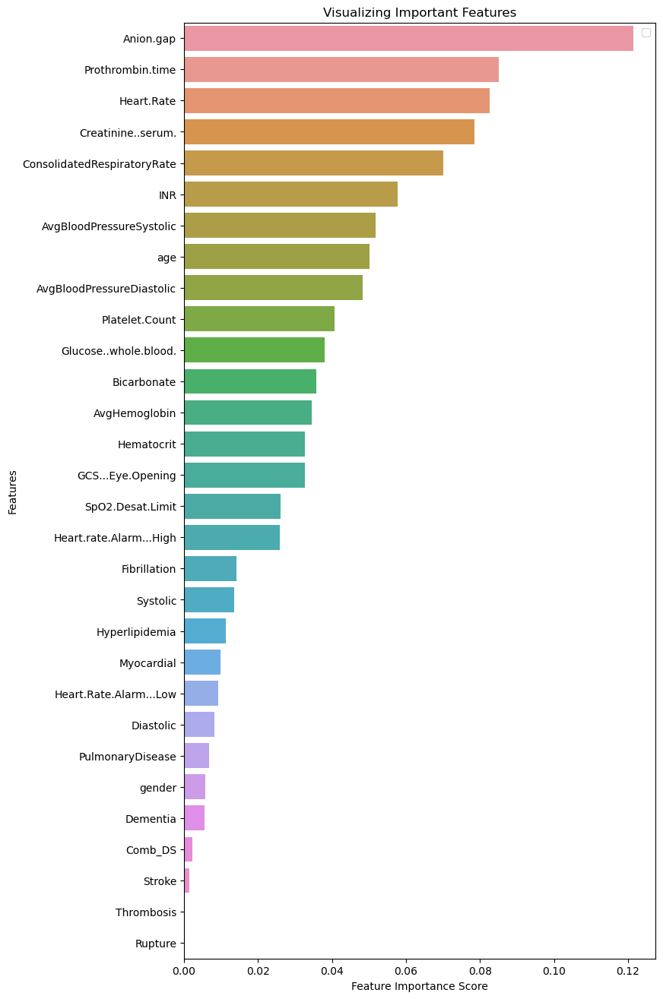

Anion.gap                      0.121335
Prothrombin.time               0.085023
Heart.Rate                     0.082610
Creatinine..serum.             0.078530
ConsolidatedRespiratoryRate    0.070112
INR                            0.057747
AvgBloodPressureSystolic       0.051761
age                            0.050076
AvgBloodPressureDiastolic      0.048356
Platelet.Count                 0.040649
Glucose..whole.blood.          0.038092
Bicarbonate                    0.035770
AvgHemoglobin                  0.034532
Hematocrit                     0.032740
GCS...Eye.Opening              0.032692
SpO2.Desat.Limit               0.026056
Heart.rate.Alarm...High        0.025947
Fibrillation                   0.014245
Systolic                       0.013572
Hyperlipidemia                 0.011317
Myocardial                     0.009950
Heart.Rate.Alarm...Low         0.009145
Diastolic                      0.008154
PulmonaryDisease               0.006741
gender                         0.005728


In [23]:
feature_imp = pd.Series(search_rus.feature_importances_, index=X.columns).sort_values(ascending=False)
feature_imp

plt.figure(figsize = (8, 16))
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

feature_imp

# Confusion Matrix Analysis

## Compare mortality result vs predicted by model.

In this section an analysis of result in confusion matrix will be presented. 

1) Test data has to be select and storage in a ddr frame for comparison.
2) Add colum with real result. (_test_rus)
3) Add colum with predicted result (y_pred_rus)
4) Add a colum to identify if prediction was wrong.


In [24]:
# TEST
## Data set preparation for comparisson for TEST

dfComparison = X_test_rus
dfComparison['y_test_rus'] = y_test_rus
dfComparison['y_pred_rus'] = y_pred_rus

# Calculate in columa FalsePosNeg if predution was wrong
# False means prediction was wrong.

dfComparison['FalsePosNeg'] = dfComparison['y_test_rus'] == dfComparison['y_pred_rus']

# Confusion Matrix

In this section confusion matrix and an analysis of errors for most important fuertures for Random forest model.
1) plot confusion matrix

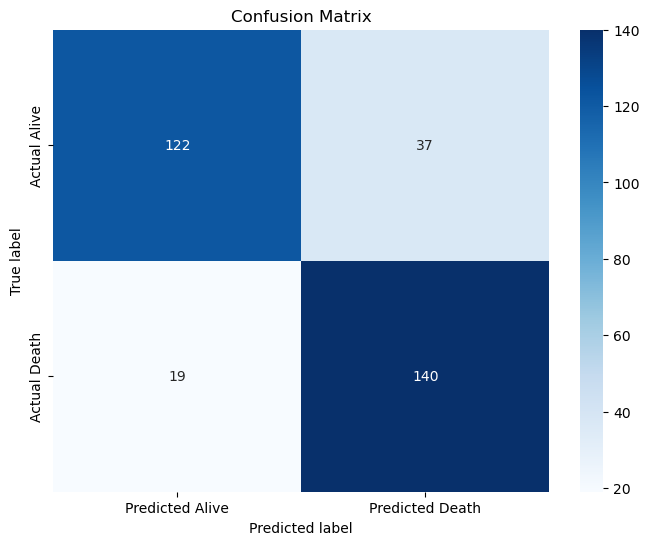

array([[122,  37],
       [ 19, 140]], dtype=int64)

In [25]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# True labels and predicted labels
true_labels = y_test_rus
predicted_labels = y_pred_rus

# Calculate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted Alive', 'Predicted Death'], yticklabels=['Actual Alive', 'Actual Death'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()
cm

## References Papper to do error analysis of confusison matrix.

Ruuska, Salla, Wilhelmiina Hämäläinen, Sari Kajava, Mikaela Mughal, Pekka Matilainen, and Jaakko Mononen. 2018. 
    “Evaluation of      the Confusion Matrix Method in the Validation of an Automated System for Measuring Feeding Behaviour of Cattle.” Behavioural Processes 148 (March): 56–62. doi:10.1016/j.beproc.2018.01.004.


Link to papper:
https://www-sciencedirect-com.ezproxy.langara.ca/science/article/pii/S0376635717301146?via%3Dihub

### Main Concept
F1-score: F1-score is the harmonic mean of precision and recall. It provides a balance between precision and recall, particularly useful when dealing with imbalanced datasets. F1-score is calculated as:

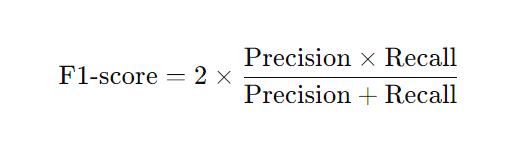

Below calculatio of precision, recall, and other metris for confusion matrix analysis.

#### Definitions
TP: True Positive

FP: False Positive

TN: True Negative

FN: False Negative

Each item represent clasification of predictions in confussion matrix.

In [26]:
# Evaluation of the Confusion Matrix Method

# Check Confusion matrix values
# cm[0][0]

TP = cm[0][0]  # upper left
FP = cm[1][0]  # lower left 
TN = cm[1][1]  # lower rigth
FN = cm[0][1]  # upper rigth

# precision = TP/ (TP + FP)
precision = TP/ (TP + FP)
print('precision = TP/ (TP + FP) is '+ str(round(precision,2)))

# sensitivity/recall = TP/(TP + FN)
sensitivity = TP/(TP + FN)
print('sensitivity = TP/(TP + FN) is '+ str(round(sensitivity,2)))

# specificity = TN/(TN + FP)
specificity = TN/(TN + FP)
print('specificity = TN/(TN + FP) '+ str(round(specificity,2)))

# accuracy = (TP + TN)/(TP + TN + FP + FN).
accuracy = (TP + TN)/(TP + TN + FP + FN)
print('accuracy = (TP + TN)/(TP + TN + FP + FN). '+ str(round(accuracy,2)))

# F1-Score 
F1_Score = 2*(precision*sensitivity)/(precision+sensitivity)
print('F1-Score:'+ str(round(F1_Score,2)))



precision = TP/ (TP + FP) is 0.87
sensitivity = TP/(TP + FN) is 0.77
specificity = TN/(TN + FP) 0.88
accuracy = (TP + TN)/(TP + TN + FP + FN). 0.82
F1-Score:0.81


# Conclusion of F1 test

Model has a good balance with a *0.79* near 1 and accuracy of *80%* , these sugest balance between precision and recall is good suggests that the model is effectively predicting positive instances while minimizing false positives and false negatives.

So, they model is good to be use but from a balance point of view but predicition acurracy needs to be improve more.

In [27]:
# This step is to include a column in tst data set, the column concatenates as text real resul and predictect resul.
# This generates a category were correct and incorrecct predictions could be identify. 
dfComparison['ConfusionMatrix'] = dfComparison['y_test_rus'].astype(str)+'-'+dfComparison['y_pred_rus'].astype(str)
# dfComparison


In next section of code una most important features of learning mancine models are selectect to analysis with charts and tedcniques.

In [28]:
features_analysis = ['Anion.gap',
                    'Heart.Rate',
                    'Prothrombin.time',
                    'Creatinine..serum.',
                    'ConsolidatedRespiratoryRate',
                    'INR',
                    'AvgBloodPressureSystolic',
                    'AvgBloodPressureDiastolic',
                    'age',
                    # 'Platelet.Count',
                    # 'Glucose..whole.blood.',
                    # 'Bicarbonate',
                    # 'AvgHemoglobin',
                    # 'Hematocrit',
                    'ConfusionMatrix']

## Explanation

In following charts false positive, false negate, true positive and true negative values are located in a cross comparison of most important features of model.

This allows to detect paters characteristics of miss classified and correctly classified observarions.

c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


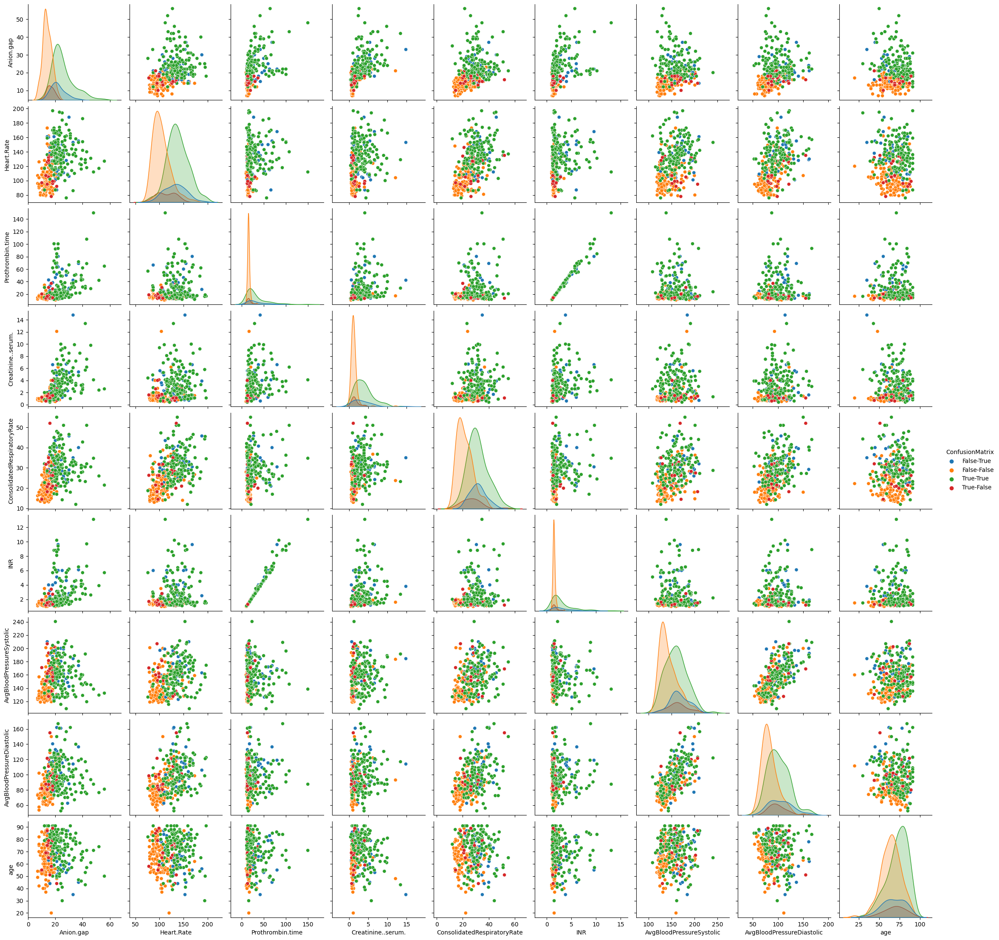

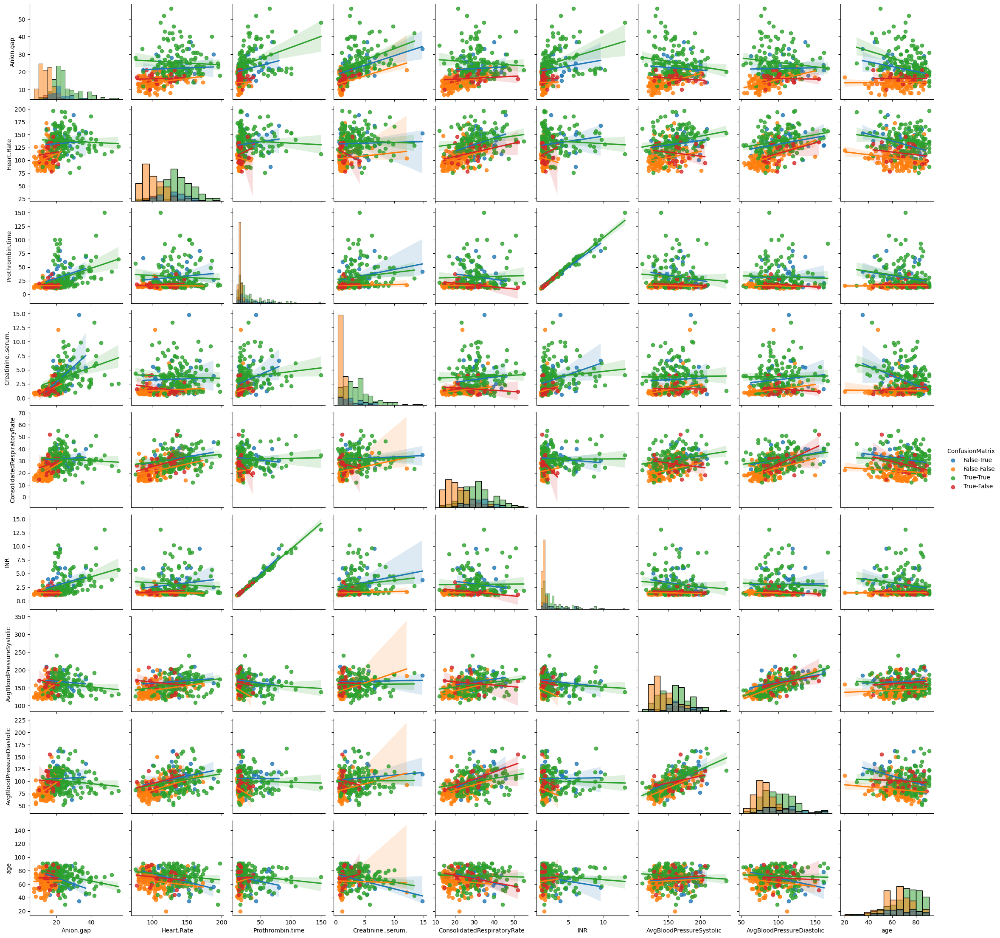

In [29]:
data = pd.DataFrame(dfComparison, columns= features_analysis)

# Create pairs plot
sns.pairplot(data, hue='ConfusionMatrix')
# g = sns.pairplot(data, hue='ConfusionMatrix')
# g.map_lower(sns.kdeplot, levels=4, color=".2")
sns.pairplot(data, hue='ConfusionMatrix', kind='reg', diag_kind= 'hist')
# sns.pairplot(data, hue='ConfusionMatrix', kind='hist')
plt.show()


Theres is a pattern, we can see that in varaibles values are gruop, they are in a similar location and there suold be a references point that splits them.

Now, in ordet to se a comparison of missclassify and correctly classified by mortality categeogry classifications gruopus are going to bre recude, we will present True Death vs False Death. in diagonal we can see that density distribution has is differrnt and is scatted plots and theother plots a line cuold be drawn so separete correct and incorrect classified.


As well, this chart analysis is done for true alive and false alive, having same result, they could be separte with a line in chart. this means there should be a difference.

Then, in next step we will compare each varaible classsification in confusion matrix to detect differences.



c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


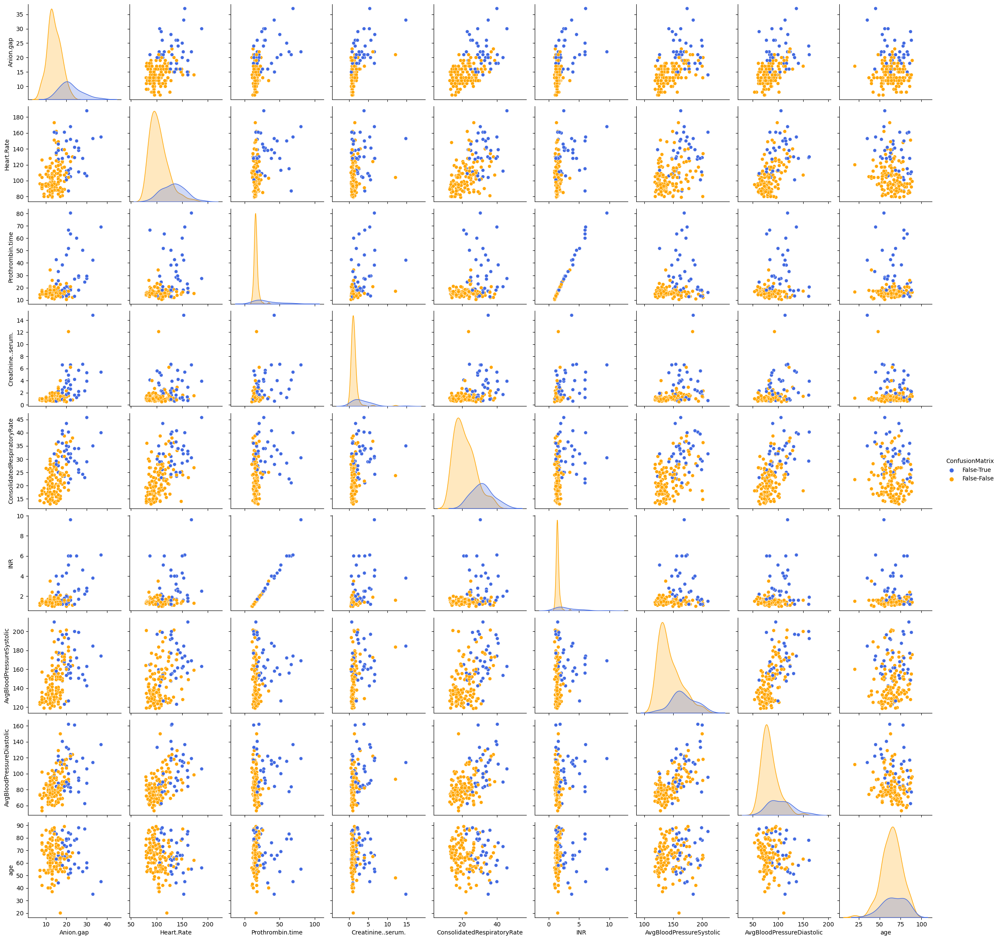

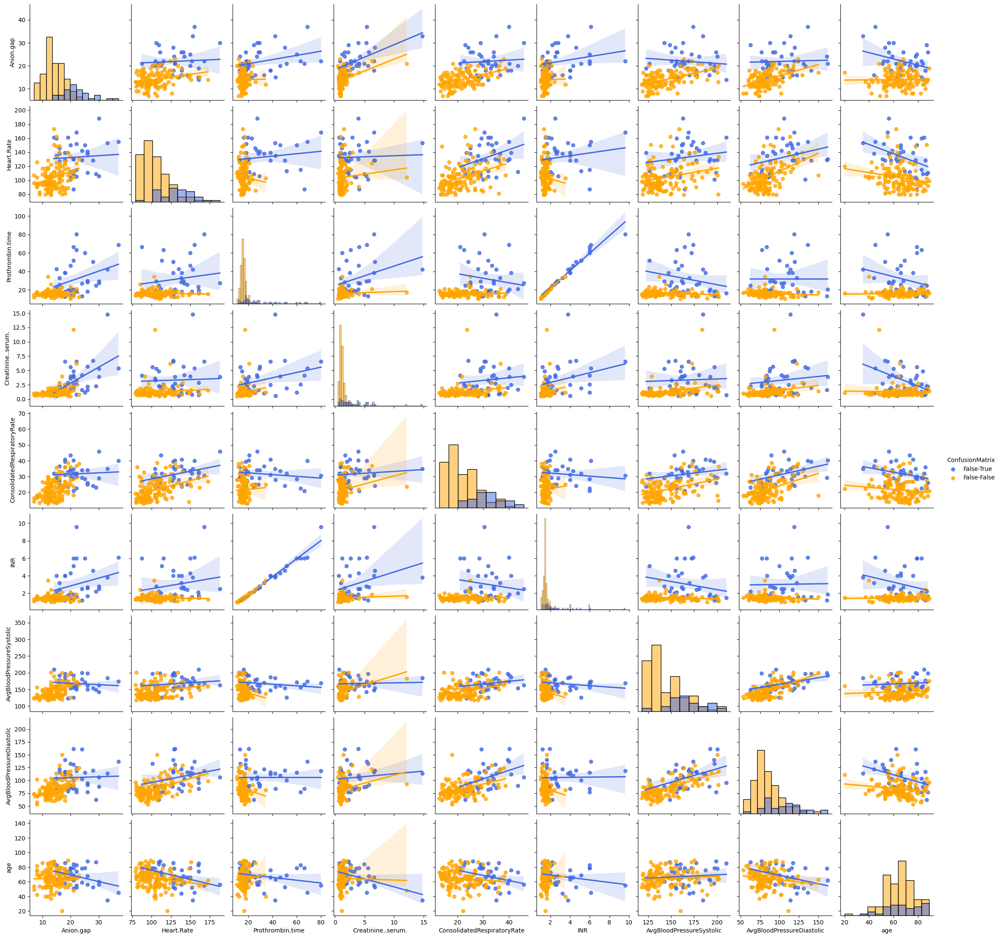

In [30]:
# ALIVE After ploting all points we need to plot just miss-classified

data_MissClassified = dfComparison[(dfComparison['y_test_rus'] == False)]




data = pd.DataFrame(data_MissClassified, columns=features_analysis)
colors = {'False-True': 'royalblue' , 'False-False': 'orange'}

# Create pairs plot
sns.pairplot(data, hue='ConfusionMatrix', palette=colors)
sns.pairplot(data, kind= 'reg', hue='ConfusionMatrix', diag_kind='hist', palette=colors)
# sns.pairplot(data, kind= 'hist', hue='ConfusionMatrix')
plt.show()


c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


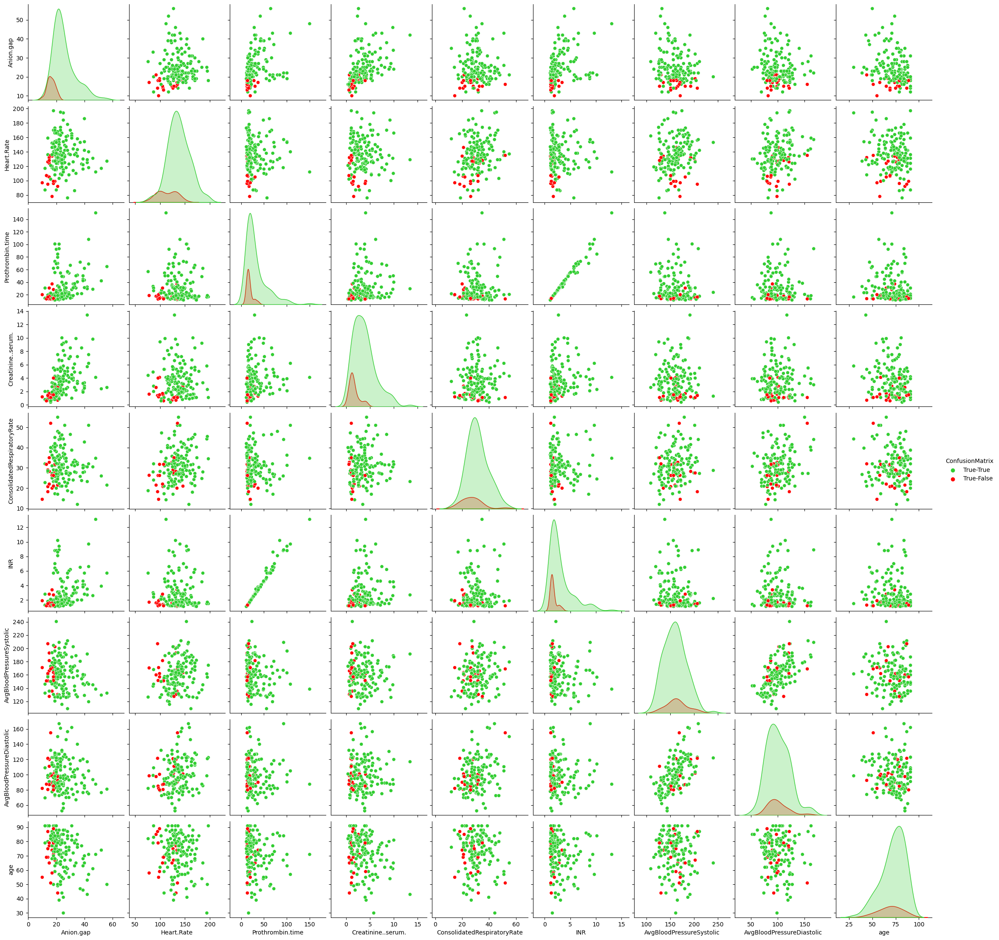

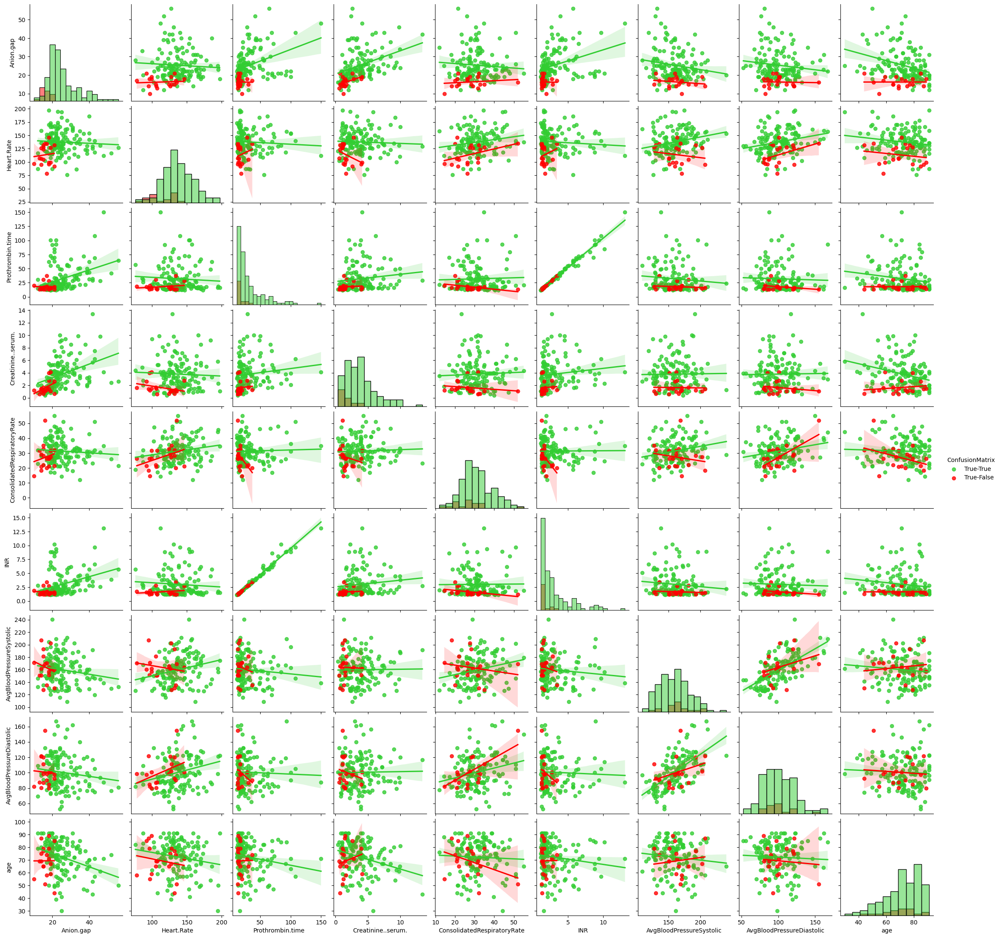

In [31]:
# DEATH After ploting all points we need to plot just miss-classified

data_MissClassified = dfComparison[(dfComparison['y_test_rus'] == True)]

data = pd.DataFrame(data_MissClassified, columns=features_analysis)

data = pd.DataFrame(data_MissClassified, columns=features_analysis)
colors = {'True-True': 'limegreen', 'True-False': 'red'}

# Create pairs plot
sns.pairplot(data, hue='ConfusionMatrix', palette=colors)
sns.pairplot(data, kind= 'reg', hue='ConfusionMatrix', diag_kind='hist', palette=colors)
# sns.pairplot(data, kind= 'hist', hue='ConfusionMatrix')
plt.show()

# Detect diffenrences by feature (Boxplots)

To detect differences of each feature depending of its clasification con  confusion matrix boxplot chart is the visual tool to do it.

As can be seen below flase positives (False-True) and true-negatives (False-False), boxplots not overlaping and with a consistent patter over most important feautures. As well, for true positives (True-True) and true negatives (True-False) show same behavior.

The explanation of missclassification for test set for most important feaure depen on value of varaible by its on and as well is related with most important varibles of prediction for the model.

In [32]:
features_boxplot = features_analysis

features_boxplot.remove('ConfusionMatrix')

In [33]:
dfComparison.columns

Index(['gender', 'age', 'Heart.Rate', 'Heart.rate.Alarm...High',
       'Heart.Rate.Alarm...Low', 'SpO2.Desat.Limit', 'INR', 'Prothrombin.time',
       'Anion.gap', 'Creatinine..serum.', 'Bicarbonate',
       'Glucose..whole.blood.', 'GCS...Eye.Opening', 'Hematocrit',
       'Platelet.Count', 'Myocardial', 'Rupture', 'Thrombosis', 'Systolic',
       'Diastolic', 'Comb_DS', 'Fibrillation', 'PulmonaryDisease', 'Stroke',
       'Hyperlipidemia', 'Dementia', 'AvgBloodPressureSystolic',
       'AvgBloodPressureDiastolic', 'ConsolidatedRespiratoryRate',
       'AvgHemoglobin', 'y_test_rus', 'y_pred_rus', 'FalsePosNeg',
       'ConfusionMatrix'],
      dtype='object')

Anion.gap


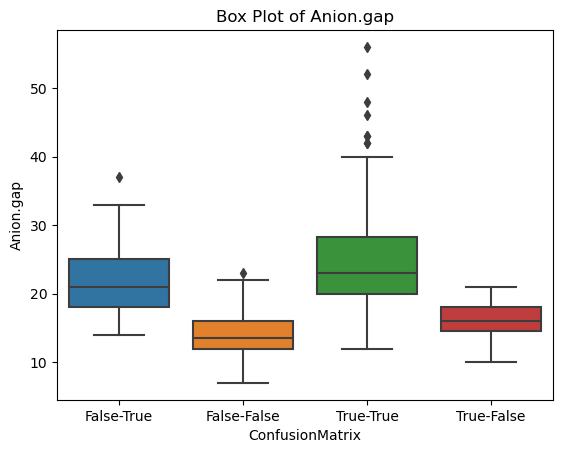

Heart.Rate


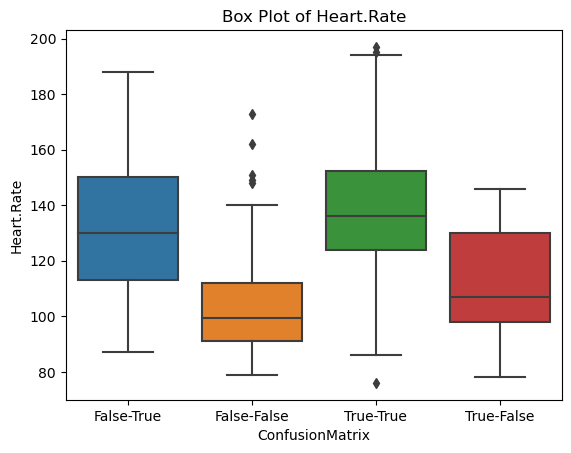

Prothrombin.time


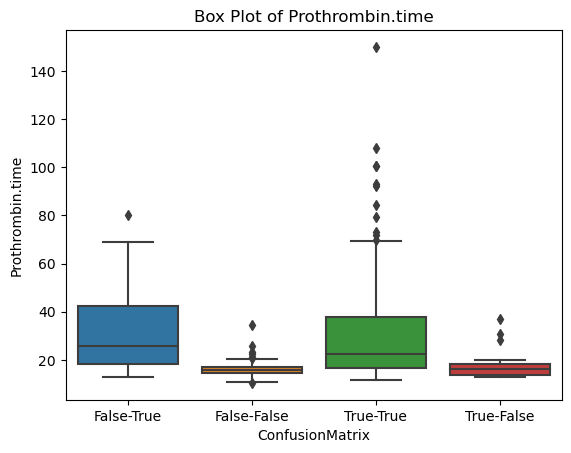

Creatinine..serum.


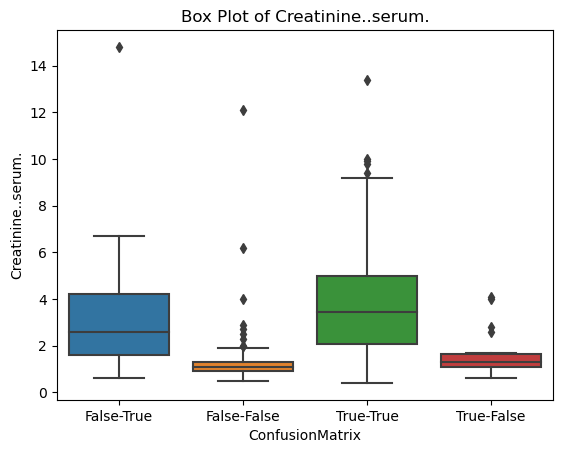

ConsolidatedRespiratoryRate


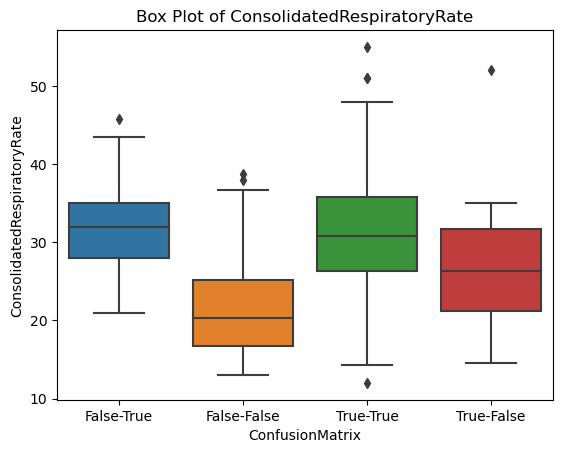

INR


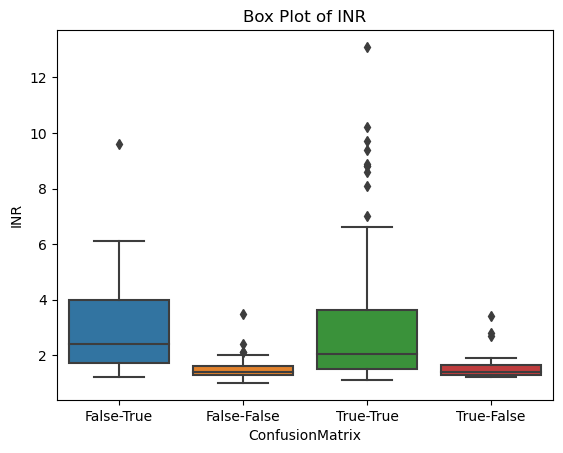

AvgBloodPressureSystolic


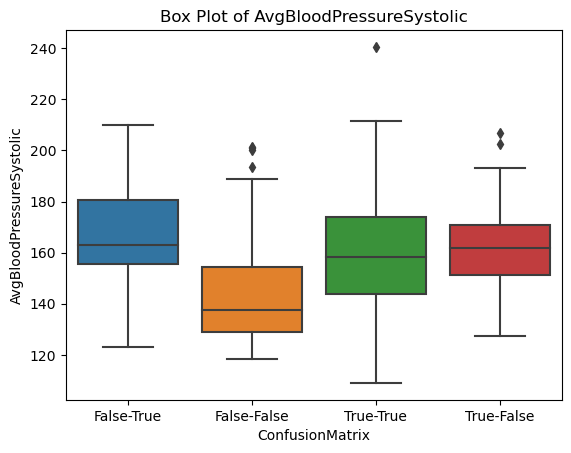

AvgBloodPressureDiastolic


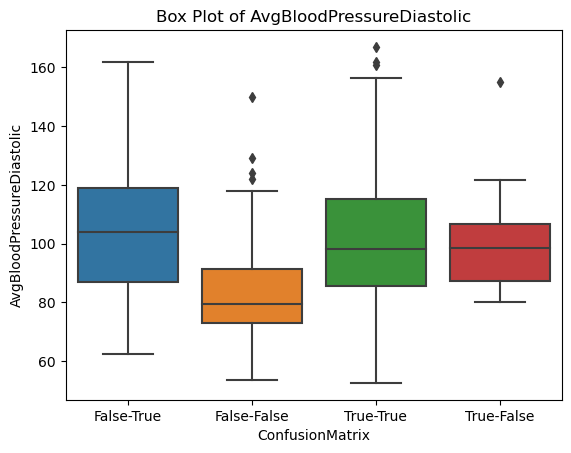

age


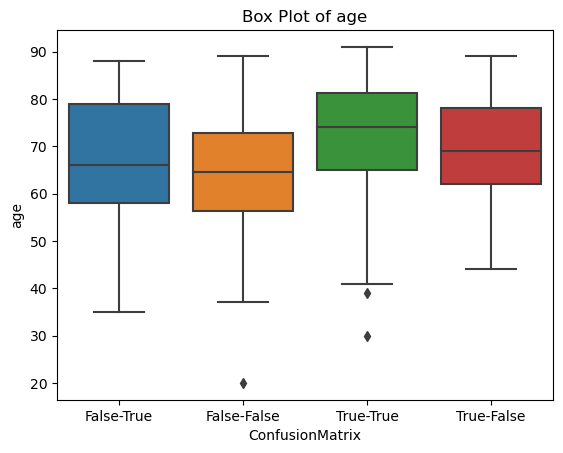

In [34]:

for feature in features_boxplot:
    # Create a figure with 3 subplots
    print(feature)
    sns.boxplot(x='ConfusionMatrix', y=str(feature), data=dfComparison)
    plt.title('Box Plot of '+str(feature))
    plt.xlabel('ConfusionMatrix')
    plt.ylabel(str(feature))
    # plt.grid(True)
    plt.show()

    # sns.scatterplot(data=dfComparison, x='subject_id', y=feature, hue='ConfusionMatrix', palette="deep")
    # plt.title('Scattet of '+str(feature))
    # plt.xlabel('Index')
    # plt.ylabel(str(feature))
    # plt.show()


